## Advance Lane Detection

# The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline


# Camera Calibration

In [3]:
import glob
import pickle
import os.path

# load calibration
mtx = None
dist = None
setting_path = "./camera_cal/wide_dist_pickle.p"
if os.path.exists(setting_path): 
    # Read in the saved calibration settings
    dist_pickle = pickle.load(open(setting_path, "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    print("Calibration settings loaded")
else: 
    path = "./camera_cal/*.jpg"
    images = glob.glob(path)
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    img_size = None


    for i in images:
        img = cv2.imread(i)
        if not img_size:
            img_size = (img.shape[1], img.shape[0])
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            write_name = './output_images/corners_found_' + os.path.split(i)[-1]
            cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
    cv2.destroyAllWindows()

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open(setting_path, "wb"))
    print("Calibration settings calculated and saved")


Calibration settings loaded


# Camera Calibration Vizualization

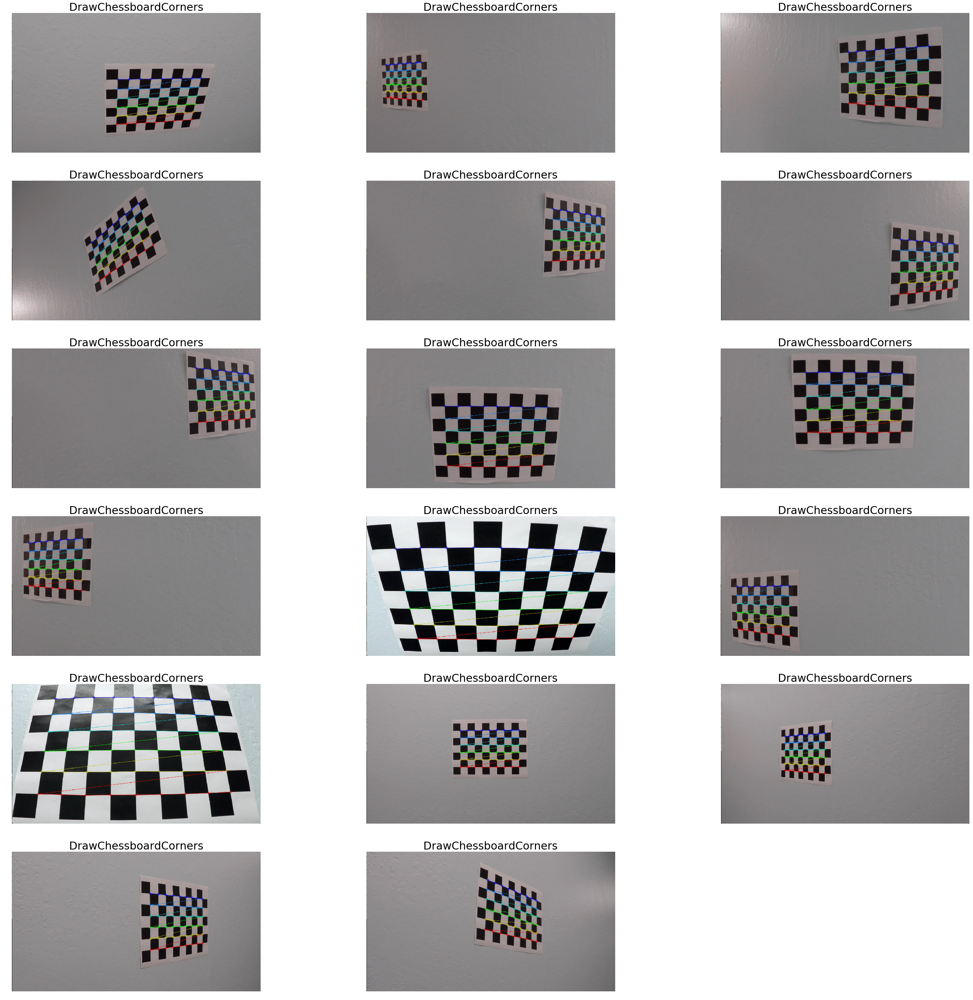

In [15]:
import math
fig = plt.figure()
fig.set_size_inches(50,50)
path = "./output_images/corners_found_*.jpg"
images = glob.glob(path)
total_image_count = len(images)
image_count = 1
for i in images:
    img = cv2.imread(i)
    ax = fig.add_subplot(math.ceil(total_image_count / 3), 3, image_count)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('DrawChessboardCorners', fontsize=30)
    image_count += 1


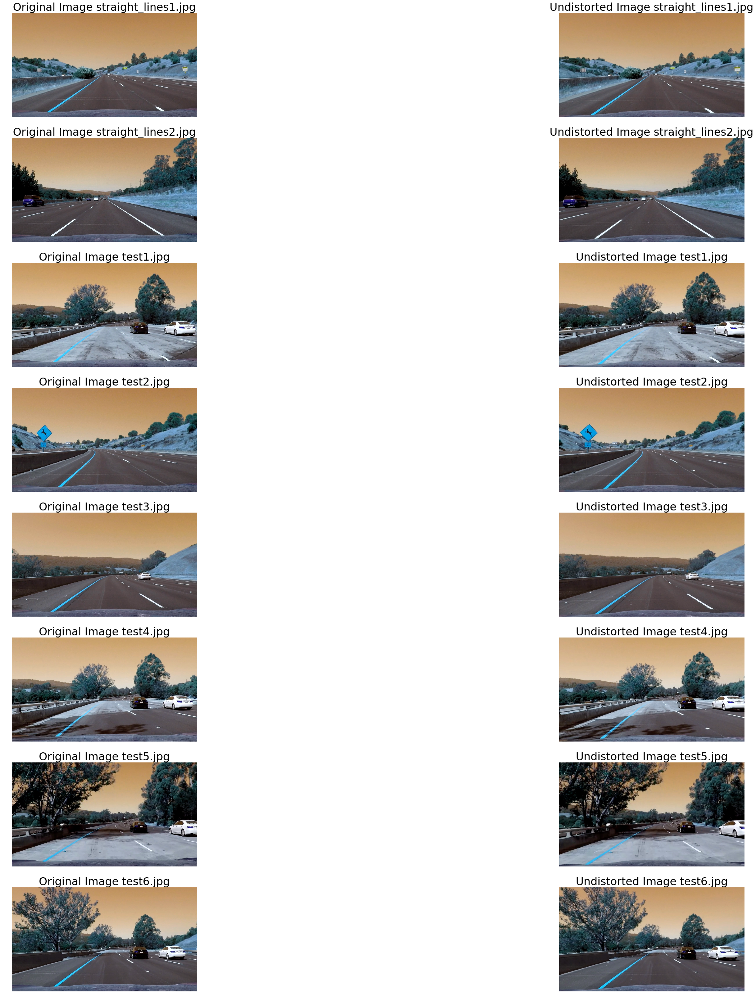

In [22]:
fig = plt.figure()
fig.set_size_inches(50,50)
path = "./test_images/*.jpg"
images = glob.glob(path)
total_image_count = len(images)
image_count = 1
for i in images:
    img = cv2.imread(i)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('./output_images/undistorted_' + os.path.split(i)[-1], dst)

    ax = fig.add_subplot(total_image_count, 2, image_count)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('Original Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    ax = fig.add_subplot(math.ceil(total_image_count), 2, image_count)
    ax.imshow(dst)
    ax.axis('off')
    ax.set_title('Undistorted Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    

# Thresholding

In [31]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


def combined_threshold(image):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 255))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.8, 1.2))

    s_binary = hls_select(image, thresh=(170, 255))

    sobel_binary = np.zeros_like(dir_binary)
    sobel_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) | (sobel_binary == 1)] = 1
    
    ret combined_binary, s_binary, sobel_binary


SyntaxError: invalid syntax (<ipython-input-31-d7ead9afe052>, line 85)

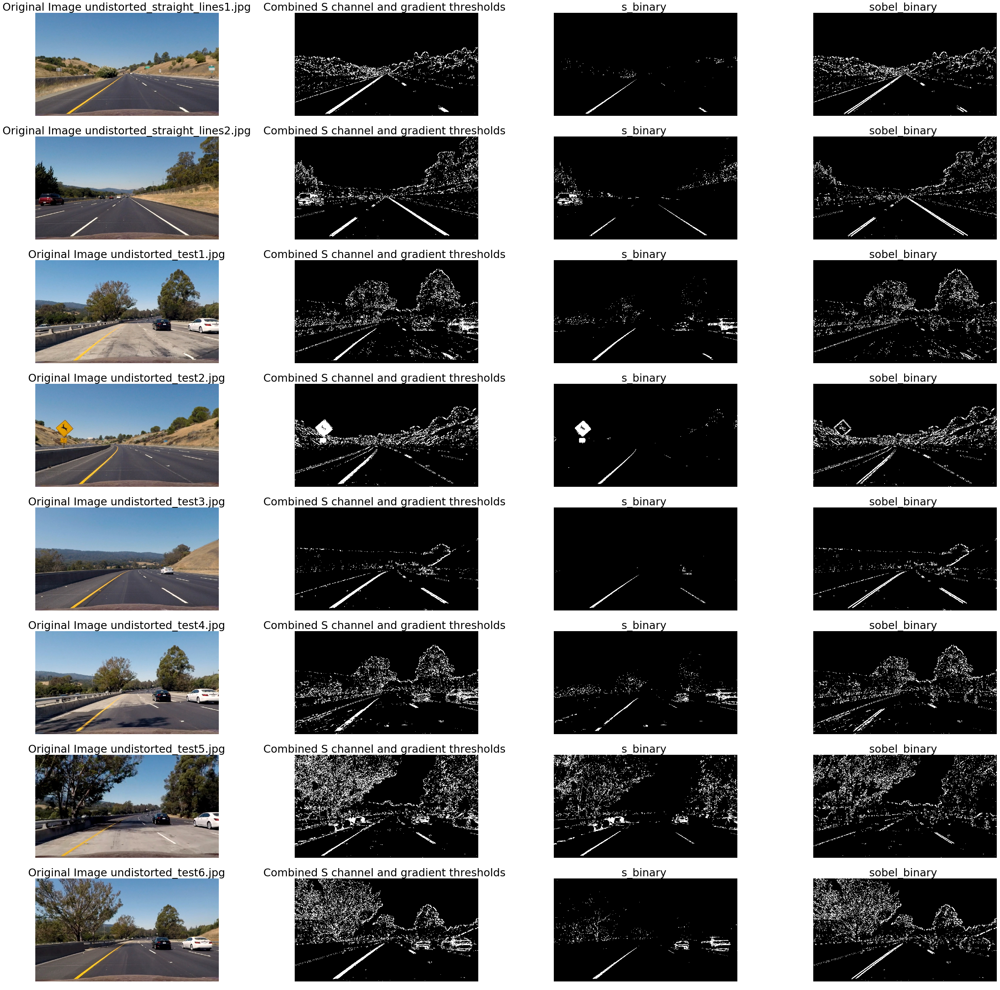

In [30]:
import glob
import os.path

path = "./output_images/undistorted_*.jpg"
images = glob.glob(path)

fig = plt.figure()
fig.set_size_inches(50,50)

total_image_count = len(images)
image_count = 1

# Sobel kernel size
ksize = 15

for i in images:
    image = mpimg.imread(i) 

    # Plotting thresholded images
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(image)
    ax.axis('off')
    ax.set_title('Original Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(combined_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('Combined S channel and gradient thresholds ', fontsize=30)
    image_count += 1
#     ax = fig.add_subplot(total_image_count, 7, image_count)
#     ax.imshow(gradx, cmap='gray')
#     ax.axis('off')
#     ax.set_title('gradx ' + os.path.split(i)[-1], fontsize=30)
#     image_count += 1
#     ax = fig.add_subplot(total_image_count, 7, image_count)
#     ax.imshow(grady, cmap='gray')
#     ax.axis('off')
#     ax.set_title('grady ' + os.path.split(i)[-1], fontsize=30)
#     image_count += 1
#     ax = fig.add_subplot(total_image_count, 7, image_count)
#     ax.imshow(mag_binary, cmap='gray')
#     ax.axis('off')
#     ax.set_title('mag_binary ' + os.path.split(i)[-1], fontsize=30)
#     image_count += 1
#     ax = fig.add_subplot(total_image_count, 7, image_count)
#     ax.imshow(dir_binary, cmap='gray')
#     ax.axis('off')
#     ax.set_title('dir_binary ' + os.path.split(i)[-1], fontsize=30)
#     image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(s_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('s_binary ', fontsize=30)
    image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(sobel_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('sobel_binary ', fontsize=30)
    image_count += 1

  

In [ ]:
# Perspective transform